In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from sklearn.manifold import TSNE
from sklearn.neighbors import kneighbors_graph
import torch
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
import torch.nn.functional as F
import networkx as nx
import seaborn as sns

# Define paths
train_dir = "./data/original/train"
val_dir = "./data/original/val"
test_dir = "./data/original/test"

In [3]:
# Preprocess images
datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='categorical'
)

val_generator = datagen.flow_from_directory(
    val_dir, target_size=(224, 224), batch_size=32, class_mode='categorical'
)

test_generator = datagen.flow_from_directory(
    test_dir, target_size=(224, 224), batch_size=32, class_mode='categorical'
)


# Load pre-trained model
base_model = ResNet50(weights="imagenet", include_top=False, pooling="avg")
feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

Found 10940 images belonging to 14 classes.
Found 1177 images belonging to 14 classes.
Found 1185 images belonging to 14 classes.


2025-01-22 13:45:23.950715: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2025-01-22 13:45:23.950771: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-01-22 13:45:23.950786: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2025-01-22 13:45:23.951188: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-01-22 13:45:23.951659: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


94765736/94765736 [==============================] - 8s 0us/step


In [4]:
# Extract features
def extract_features(generator):
    features, labels = [], []
    for batch in generator:
        imgs, lbls = batch
        batch_features = feature_extractor.predict(imgs)
        features.append(batch_features)
        labels.append(lbls)
        if len(features) * generator.batch_size >= generator.n:
            break
    return np.vstack(features), np.vstack(labels)

In [5]:
train_features, train_labels = extract_features(train_generator)
val_features, val_labels = extract_features(val_generator)
test_features, test_labels = extract_features(test_generator)

2025-01-22 13:45:48.268581: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 23ms/step


2025-01-22 13:47:01.938401: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 990ms/step


In [7]:
# Create graph
def create_graph(features, labels, k=5):
    adj_matrix = kneighbors_graph(features, k, mode='connectivity', include_self=False)
    edge_index = torch.tensor(adj_matrix.nonzero(), dtype=torch.long)
    x = torch.tensor(features, dtype=torch.float)
    y = torch.tensor(labels.argmax(axis=1), dtype=torch.long)
    return Data(x=x, edge_index=edge_index, y=y)

In [8]:
train_graph = create_graph(train_features, train_labels)
val_graph = create_graph(val_features, val_labels)
test_graph = create_graph(test_features, test_labels)

/var/folders/9d/wb464w3106z5ftt3ymdcn6t00000gn/T/ipykernel_38664/3928981505.py:4: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:281.)
  edge_index = torch.tensor(adj_matrix.nonzero(), dtype=torch.long)


In [25]:
def plot_sample_images(directory, classes, num_images=5):
    fig, axes = plt.subplots(len(classes), num_images, figsize=(15, len(classes) * 3))
    for i, cls in enumerate(classes):
        cls_dir = os.path.join(directory, cls)
        sample_images = os.listdir(cls_dir)[:num_images]
        for j, img_name in enumerate(sample_images):
            img_path = os.path.join(cls_dir, img_name)
            img = load_img(img_path, target_size=(224, 224))
            axes[i, j].imshow(img)
            axes[i, j].axis("off")
            axes[i, j].set_title(cls)
    plt.tight_layout()
    plt.show()

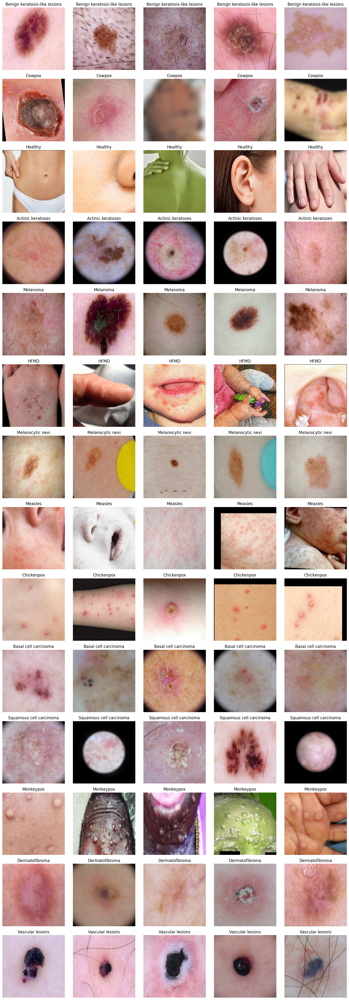

In [26]:
train_classes = os.listdir(train_dir)
train_classes = [item for item in train_classes if item != '.DS_Store']

plot_sample_images(train_dir, train_classes)

In [27]:
def visualize_embeddings(features, labels, method="tsne", title="Feature Embeddings"):
    if method == "tsne":
        reducer = TSNE(n_components=2, random_state=42)
    embeddings = reducer.fit_transform(features)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=embeddings[:, 0], y=embeddings[:, 1], hue=labels.argmax(axis=1), palette="tab10")
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.legend(title="Classes", loc="best")
    plt.show()

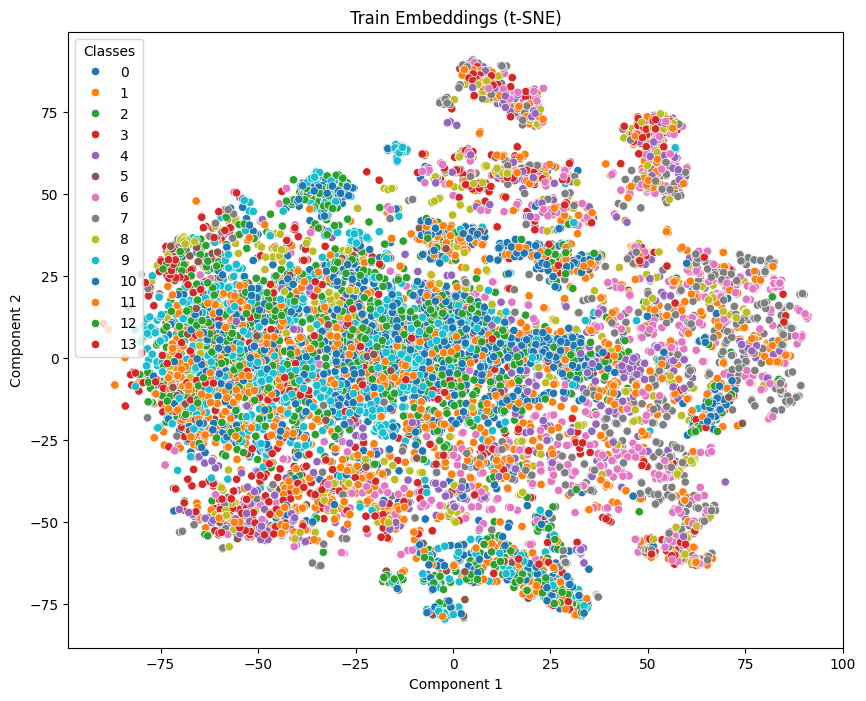

In [28]:
visualize_embeddings(train_features, train_labels, method="tsne", title="Train Embeddings (t-SNE)")

In [29]:
def plot_graph(graph, labels, title="Graph Visualization"):
    G = nx.Graph()
    G.add_edges_from(graph.edge_index.numpy().T)
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(
        G, pos, node_size=50, node_color=labels.numpy(), cmap=plt.cm.tab10, with_labels=False
    )
    plt.title(title)
    plt.show()

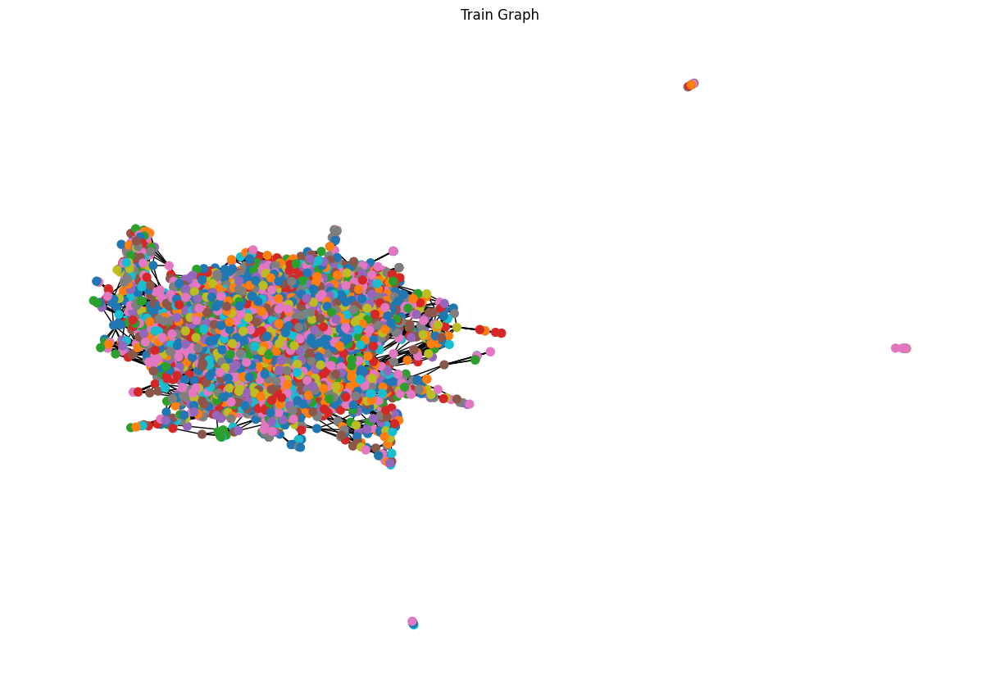

In [30]:
plot_graph(train_graph, train_graph.y, title="Train Graph")

In [31]:
class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

In [32]:
model = GCN(
    in_channels=train_graph.x.shape[1], 
    hidden_channels=64, 
    out_channels=len(train_labels[0])
)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

In [33]:
def train(model, graph):
    model.train()
    optimizer.zero_grad()
    out = model(graph.x, graph.edge_index)
    loss = criterion(out, graph.y)
    loss.backward()
    optimizer.step()
    return loss.item()

def evaluate(model, graph):
    model.eval()
    with torch.no_grad():
        out = model(graph.x, graph.edge_index)
        pred = out.argmax(dim=1)
        correct = (pred == graph.y).sum()
        return correct / graph.y.size(0)

In [34]:
losses, val_accuracies = [], []
for epoch in range(100):
    loss = train(model, train_graph)
    val_accuracy = evaluate(model, val_graph)
    losses.append(loss)
    val_accuracies.append(val_accuracy)
    print(f"Epoch {epoch + 1}, Loss: {loss:.4f}, Val Accuracy: {val_accuracy:.4f}")


Epoch 1, Loss: 2.9299, Val Accuracy: 0.0850
Epoch 2, Loss: 4.9274, Val Accuracy: 0.0731
Epoch 3, Loss: 4.1926, Val Accuracy: 0.0858
Epoch 4, Loss: 3.5700, Val Accuracy: 0.0527
Epoch 5, Loss: 3.1268, Val Accuracy: 0.0527
Epoch 6, Loss: 2.8650, Val Accuracy: 0.0850
Epoch 7, Loss: 2.7066, Val Accuracy: 0.0850
Epoch 8, Loss: 2.7045, Val Accuracy: 0.0739
Epoch 9, Loss: 2.7009, Val Accuracy: 0.0875
Epoch 10, Loss: 2.6942, Val Accuracy: 0.0884
Epoch 11, Loss: 2.6746, Val Accuracy: 0.0909
Epoch 12, Loss: 2.6426, Val Accuracy: 0.0739
Epoch 13, Loss: 2.6252, Val Accuracy: 0.0884
Epoch 14, Loss: 2.6222, Val Accuracy: 0.0731
Epoch 15, Loss: 2.6215, Val Accuracy: 0.0824
Epoch 16, Loss: 2.6226, Val Accuracy: 0.0841
Epoch 17, Loss: 2.6217, Val Accuracy: 0.0850
Epoch 18, Loss: 2.6204, Val Accuracy: 0.0850
Epoch 19, Loss: 2.6190, Val Accuracy: 0.0850
Epoch 20, Loss: 2.6176, Val Accuracy: 0.0850
Epoch 21, Loss: 2.6162, Val Accuracy: 0.0850
Epoch 22, Loss: 2.6147, Val Accuracy: 0.0850
Epoch 23, Loss: 2.6

In [35]:
def plot_training_history(losses, val_accuracies, epochs):
    plt.figure(figsize=(12, 5))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs + 1), losses, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Loss")
    plt.legend()

    # Validation accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs + 1), val_accuracies, label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Validation Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

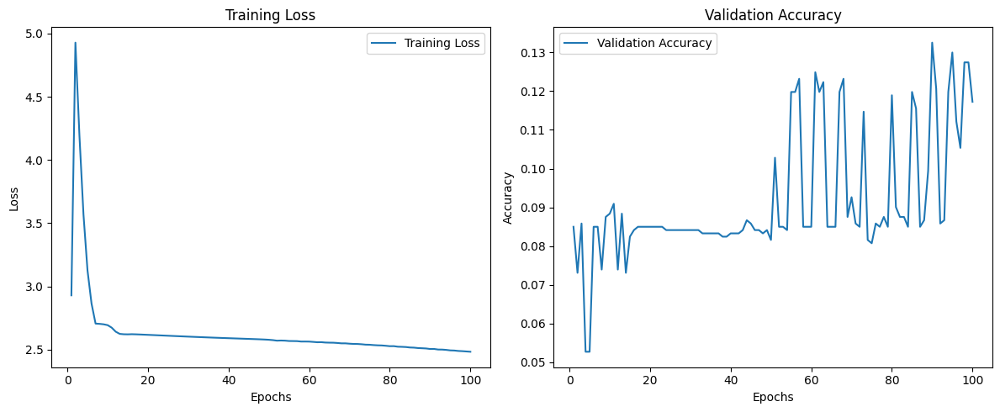

In [36]:
plot_training_history(losses, val_accuracies, epochs=100)

In [37]:
test_accuracy = evaluate(model, test_graph)
print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.1131
